In [1]:
!date

Mon Nov  9 09:42:54 PST 2020


# Merfish

In [1]:
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches
import scanpy as scanp
from scipy.stats import ks_2samp, ttest_ind
from scipy.sparse import csr_matrix
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NeighborhoodComponentsAnalysis
from matplotlib import cm
from scipy.spatial import ConvexHull
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize

import sys
sys.path.append('/home/sina/projects/mop/BYVSTZP_2020/trackfig')
from trackfig.utils import get_notebook_name
from trackfig.trackfig import trackfig 

TRACKFIG = "/home/sina/projects/mop/BYVSTZP_2020/trackfig.txt"
NB = get_notebook_name()


import warnings
warnings.filterwarnings('ignore')

fsize=20

plt.rcParams.update({'font.size': fsize})
%config InlineBackend.figure_format = 'retina'

In [2]:
clusters = pd.read_csv("../../reference/merfish/updated/cell_metadata.csv")
clusters.index = clusters["Unnamed: 0"].values
del clusters["Unnamed: 0"]

In [3]:
adata = anndata.read_h5ad("../..//data/merfish/biorxiv_link/counts.h5ad")


In [4]:
clusters.index = adata.obs.index.values

In [5]:
tmp = pd.DataFrame({col: adata.obs.index.map(clusters[col]) for col in clusters})
adata.obs = tmp

In [6]:
adata.obs.head()

,fovID,fov_x,fov_y,volume,center_x,center_y,slice_id,sample_id,label,subclass,class_label
0,13,4539.310,2986.899,992.830060,4738.397298,3075.327399,mouse2_slice31,dataset2_sample4,Astro_1,Astrocytes,Other
1,290,-4016.860,1404.780,610.091871,-3964.711404,1451.889047,mouse2_slice160,dataset2_sample5,Endo,Endothelial,Other
2,113,750.406,1143.102,148.277718,805.843523,1215.035473,mouse2_slice109,dataset2_sample6,SMC,SMC,Other
3,432,1262.680,-3752.030,249.515471,1348.686198,-3589.955255,mouse1_slice71,dataset1_sample2,Endo,Endothelial,Other
4,354,-3627.450,-1987.730,1779.831996,-3584.650904,-1883.105955,mouse2_slice219,dataset2_sample5,L23_IT_3,L23_IT,Glutamatergic


In [7]:
adata.layers["X"] = csr_matrix(adata.X)
adata.layers["norm"] = normalize(adata.X, norm='l1', axis=1)*1000000
adata.layers["log1p"] = csr_matrix(np.log1p(adata.layers["norm"]))

In [8]:
from sklearn.preprocessing import scale

In [9]:
%%time
mat = adata.layers["log1p"].todense()
mtx = scale(mat, axis=0, with_mean=True, with_std=True, copy=True)
adata.X = mtx

CPU times: user 1.99 s, sys: 1.14 s, total: 3.13 s
Wall time: 3.13 s


In [10]:
adata

AnnData object with n_obs × n_vars = 280327 × 254
    obs: 'fovID', 'fov_x', 'fov_y', 'volume', 'center_x', 'center_y', 'slice_id', 'sample_id', 'label', 'subclass', 'class_label'
    layers: 'X', 'norm', 'log1p'

In [11]:
adata.obs.subclass.value_counts()

L23_IT              41996
L45_IT              34901
L6_CT               26278
Astrocytes          22879
Oligodendrocytes    21196
Endothelial         20335
L5_IT               19585
L6_IT               15598
L5_PT                8320
Microglia            8078
Pvalb                7682
Pericytes            7206
VLMC                 6923
OPC                  6137
PVM                  5345
SMC                  4246
Sst                  3954
L56_NP               3896
other                3771
L6b                  3500
Lamp5                3156
Vip                  2931
L6_IT_Car3           1827
Sncg                  348
Sst_Chodl             239
Name: subclass, dtype: int64

In [12]:
gb = adata.obs.groupby("slice_id")["center_x", "center_y"]

In [13]:
adata.shape

(280327, 254)

In [14]:
# March1 gene was renamed to 1-Mar
as_list = adata.var.index.tolist()
idx = as_list.index("1-Mar")
as_list[idx] = "March1"
adata.var.index = as_list

In [15]:
adata.var.loc[adata.var.eval("index == 'March1'")]

""
March1


In [16]:
cols = ["transcript_id", "gene_id", "gene_name", "transcript_name", "chromosome", "start", "stop", "strand"]
t2g = pd.read_csv("../../reference/t2g.txt", sep="\t", header=None, names=cols)

In [17]:
c = t2g.groupby("gene_name")["transcript_id"].nunique()

In [18]:
adata.var["n_iso"] = adata.var.index.map(c)

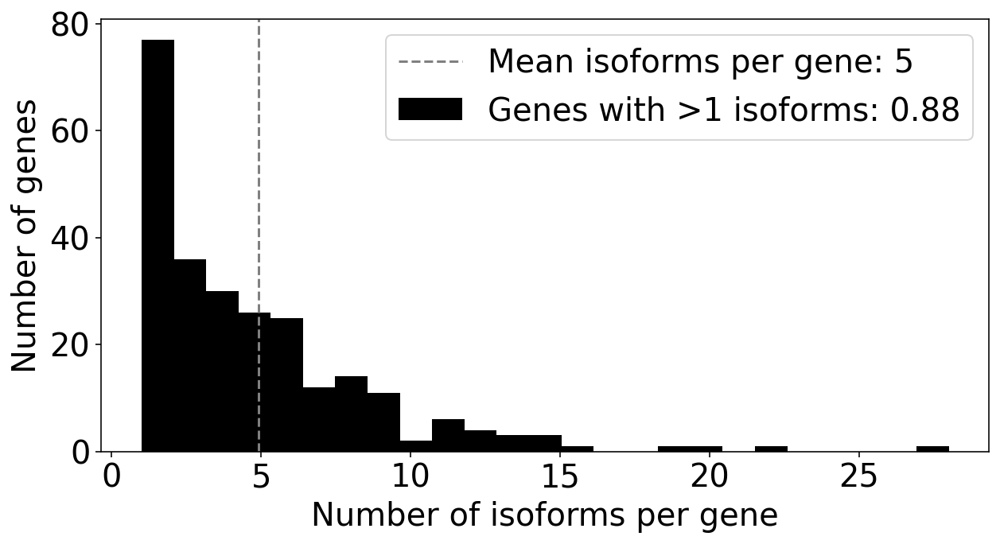

In [19]:
fig, ax = plt.subplots(figsize=(10,5))
x = adata.var["n_iso"].values
ax.hist(x, bins=25, color="k", label="Genes with >1 isoforms: {:,.2f}".format((x>1).sum()/x.shape[0]))

ax.set_xlabel("Number of isoforms per gene")
ax.set_ylabel("Number of genes")

ax.axvline(x.mean(), color="grey", linestyle="--", label="Mean isoforms per gene: {:,.0f}".format(x.mean()))

ax.legend()
plt.savefig(trackfig("../../figures/merfish-updated_isoform_distribution.png", TRACKFIG, NB), bbox_inches='tight', dpi=300)

plt.show()

In [19]:
gene = "Pvalb"

In [20]:
gene in adata.var.index.values

True

In [21]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

In [22]:
slice_id = adata.obs.slice_id.values
slice_id = np.unique(slice_id)

In [26]:
tf = { # row 1
    0: "rotate_180",
    1: "rotate_180",
    2: "rotate_90",
    3: "rotate_180",
    4: "flip_y",
    5: "flip_y",
    6: "none",
    7: "none",
    # row 2
    8: "none",
    9: "rotate_90_r",
    10: "rotate_90",
    11: "rotate_180",
    12: "rotate_90",
    13: "rotate_90",
    14: "none",
    15: "none",
    #row 3
    16: "rotate_90_r",
    17: "rotate_180",
    18: "rotate_180",
    19: "rotate_180",
    20: "none",
    21: "none",
    22: "rotate_90_r",
    23: "rotate_180",
    # row 4
    24: "none",
    25: "rotate_180",
    26:  "rotate_90",
    27: "none",
    28: "flip_x",
    29: "none",
    30: "none",
    31: "flip_x",
    # row 5
    32: "rotate_90",
    33: "flip_y",
    34: "rotate_180",
    35: "rotate_180",
    36: "flip_x",
    37: "rotate_90",
    38: "rotate_90_r",
    39: "rotate_90",
    # row 6
    40: "rotate_90",
    41: "rotate_90",
    42: "rotate_90_r",
    43: "rotate_90",
    44: "rotate_180",
    45: "none",
    46: "none",
    47: "none",
    # row 7
    48: "none",
    49: "flip_y",
    50: "none",
    51: "none",
    52: "none",
    53: "rotate_180",
    54: "none",
    55: "rotate_180",
    # row 8
    56: "flip_y",
    57: "rotate_180",
    58: "rotate_180",
    59: "flip_y",
    60: "rotate_180",
    61: "none",
    62: "rotate_180",
    63: "rotate_180"
}

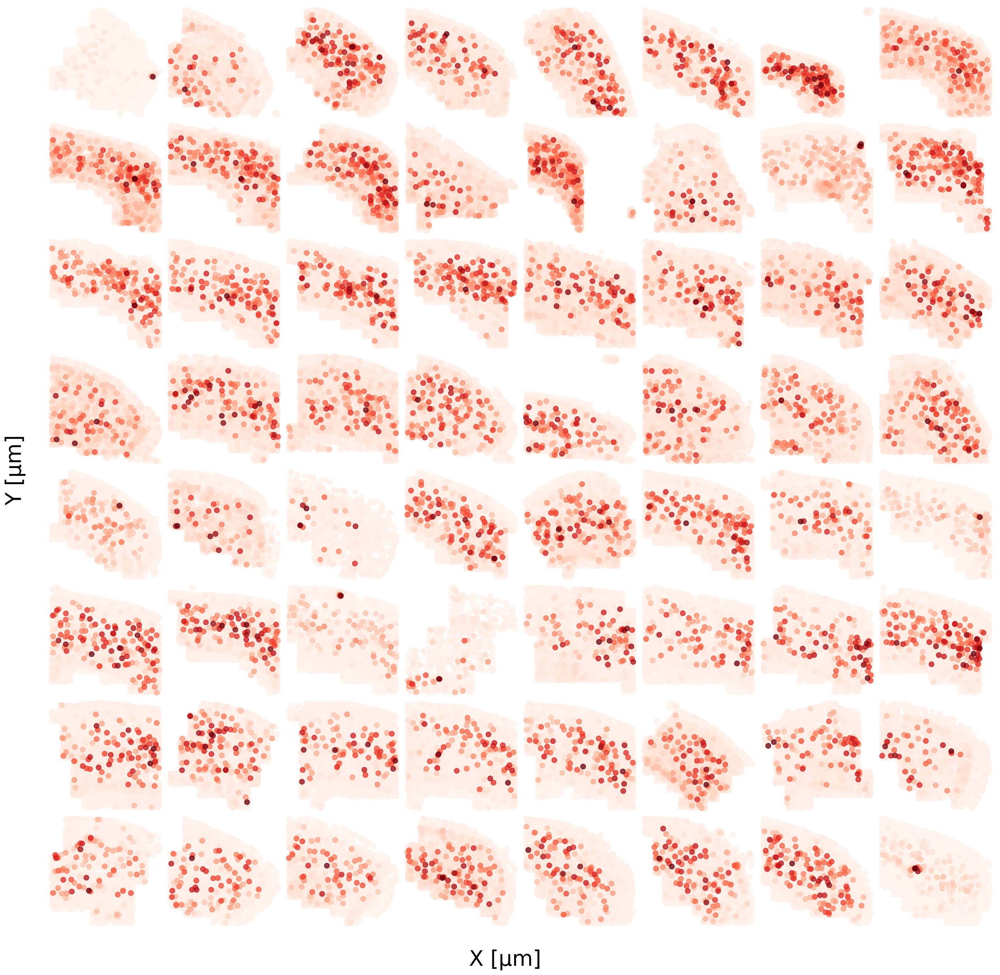

CPU times: user 38.8 s, sys: 572 ms, total: 39.4 s
Wall time: 39.2 s


In [34]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=8, nrows=8)
fig.subplots_adjust(hspace=0, wspace=0)
axs = trim_axs(ax, len(slice_id))

gene_vec = adata.layers["X"].todense()[:,adata.var.index == gene]


for sidx, (ax, slice_name, tf_rule) in enumerate(zip(axs, slice_id, tf.items())):

    s = gb.get_group(slice_id[sidx])
    
    X_mask = s.index.values.astype(int)
    
    x = adata.obs["center_x"][X_mask]
    y = adata.obs["center_y"][X_mask]
    
    # points = np.array([x.tolist(), y.tolist()]).T
    # hull = ConvexHull(points)
    
    c = np.asarray(gene_vec[X_mask]).reshape(-1)
    argsort = np.argsort(c)
    x = x.values[argsort]
    y = y.values[argsort]
    c = c[argsort]
    xx = x
    yy = y
    if tf_rule[1] == "flip_x":
        xx = -x
    elif tf_rule[1] == "flip_y":
        yy = -y
    elif tf_rule[1] == "rotate_90":
        xx = -y
        yy = x
    elif tf_rule[1] == "rotate_90_r":
        xx = y
        yy = -x
    elif tf_rule[1] == "rotate_180":
        xx = - x
        yy = - y
    if sidx == 36:
        yy = xx
        xx = -y
    
    ax.scatter(xx, yy, c=c, cmap="Reds", label=slice_name, s=50, alpha=0.75)
    
    # x = points[hull.vertices,0].tolist() + [points[hull.vertices,0].tolist()[0]]
    # y = points[hull.vertices,1].tolist() + [points[hull.vertices,1].tolist()[0]]
    # ax.plot(x, y, color="grey")
    ax.set_xlabel("X [µm]")
    ax.set_ylabel("y [µm]")
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()

fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig(trackfig("../../figures/merfish-updated_{}.png".format(gene), TRACKFIG, NB), bbox_inches='tight',dpi=300)
plt.show()

In [29]:
specific_cluster = "Pvalb"

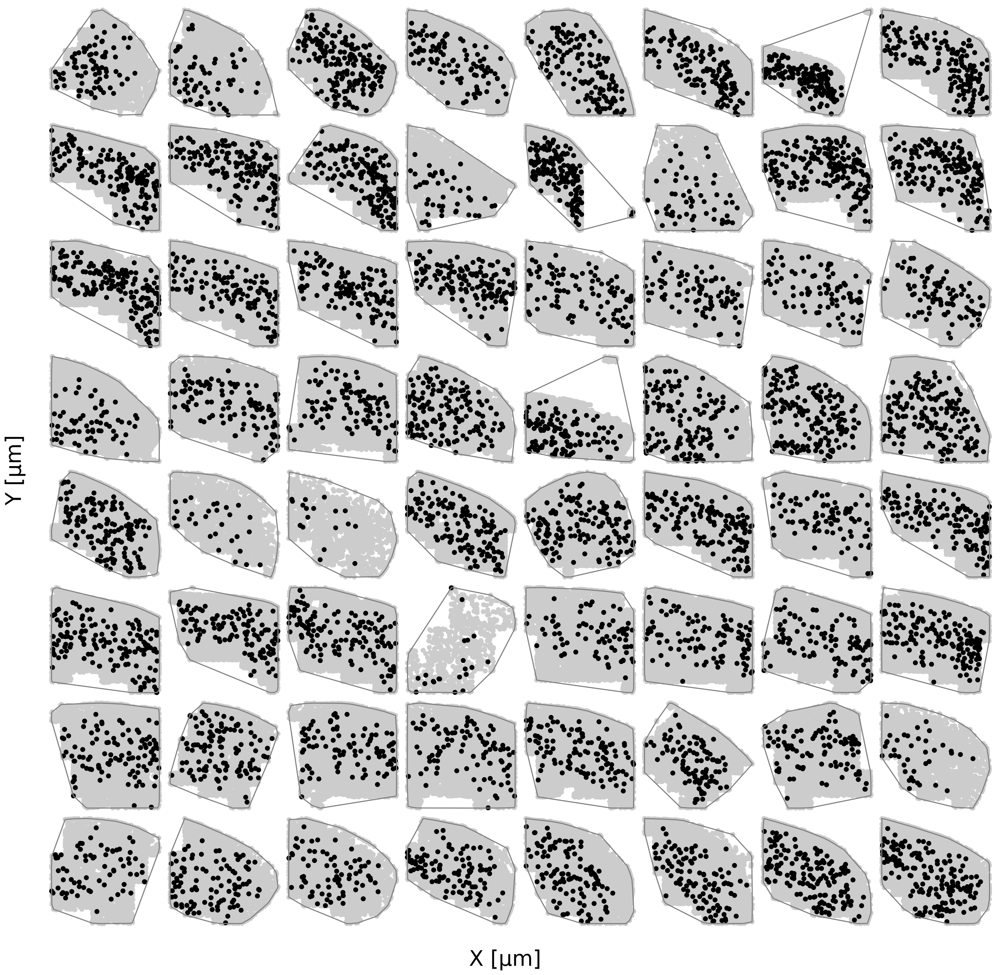

CPU times: user 31.4 s, sys: 334 ms, total: 31.7 s
Wall time: 31.5 s


In [33]:
%%time
fig, ax = plt.subplots(figsize=(24,24), ncols=8, nrows=8)
fig.subplots_adjust(hspace=0, wspace=0)

axs = trim_axs(ax, len(slice_id))

#gene_vec = adata.X[:,adata.var.index == gene]
le = LabelEncoder()
subclass_vec = le.fit_transform(adata.obs.subclass.values==specific_cluster)

for sidx, (ax, slice_name, tf_rule) in enumerate(zip(axs, slice_id, tf.items())):
    s = gb.get_group(slice_id[sidx])
    
    X_mask = s.index.values.astype(int)
    
    x = adata.obs["center_x"][X_mask]
    y = adata.obs["center_y"][X_mask]
    c = np.asarray(subclass_vec[X_mask]).reshape(-1)
    
    argsort = np.argsort(c)
    x = x.values[argsort]
    y = y.values[argsort]
    c = c[argsort]
    

    
    points = np.array([x, y]).T
    hull = ConvexHull(points)
    
    xx = x
    yy = y
    if tf_rule[1] == "flip_x":
        xx = -x
    elif tf_rule[1] == "flip_y":
        yy = -y
    elif tf_rule[1] == "rotate_90":
        xx = -y
        yy = x
    elif tf_rule[1] == "rotate_90_r":
        xx = y
        yy = -x
    elif tf_rule[1] == "rotate_180":
        xx = - x
        yy = - y
    if sidx == 36:
        yy = xx
        xx = -y
    
    ax.scatter(xx, yy, c=c, cmap="nipy_spectral_r", label=slice_name)
    

    x = np.array(points[hull.vertices,0].tolist() + [points[hull.vertices,0].tolist()[0]])
    y = np.array(points[hull.vertices,1].tolist() + [points[hull.vertices,1].tolist()[0]])
    xx = x
    yy = y
    if tf_rule[1] == "flip_x":
        xx = -x
    elif tf_rule[1] == "flip_y":
        yy = -y
    elif tf_rule[1] == "rotate_90":
        xx = -y
        yy = x
    elif tf_rule[1] == "rotate_90_r":
        xx = y
        yy = -x
    elif tf_rule[1] == "rotate_180":
        xx = - x
        yy = - y
    if sidx == 36:
        yy = xx
        xx = -y
    ax.plot(xx, yy, color="grey")
    
    
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()
    
fig.text(0.5, 0.1, 'X [µm]', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'Y [µm]', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig(trackfig("../../figures/merfish-updated_cluster_loc_{}.png".format(gene), TRACKFIG, NB), bbox_inches='tight',dpi=300)
plt.show()

In [27]:
adata.obs

,fovID,fov_x,fov_y,volume,center_x,center_y,slice_id,sample_id,label,subclass,class_label
0,13,4539.310,2986.899,992.830060,4738.397298,3075.327399,mouse2_slice31,dataset2_sample4,Astro_1,Astrocytes,Other
1,290,-4016.860,1404.780,610.091871,-3964.711404,1451.889047,mouse2_slice160,dataset2_sample5,Endo,Endothelial,Other
2,113,750.406,1143.102,148.277718,805.843523,1215.035473,mouse2_slice109,dataset2_sample6,SMC,SMC,Other
3,432,1262.680,-3752.030,249.515471,1348.686198,-3589.955255,mouse1_slice71,dataset1_sample2,Endo,Endothelial,Other
4,354,-3627.450,-1987.730,1779.831996,-3584.650904,-1883.105955,mouse2_slice219,dataset2_sample5,L23_IT_3,L23_IT,Glutamatergic
...,...,...,...,...,...,...,...,...,...,...,...
280322,386,774.760,913.600,1208.963097,890.666985,1069.905972,mouse1_slice251,dataset1_sample5,Pvalb_1,Pvalb,GABAergic
280323,327,1910.380,1079.280,611.167089,1913.334949,1280.947292,mouse2_slice261,dataset2_sample3,L5_PT_5,L5_PT,Glutamatergic
280324,89,3659.910,3432.540,130.928366,3847.387896,3589.662245,mouse1_slice112,dataset1_sample3,L45_IT_4,L45_IT,Glutamatergic
280325,300,2510.380,1279.280,799.847696,2728.208220,1376.136296,mouse2_slice261,dataset2_sample3,L5_PT_2,L5_PT,Glutamatergic


In [28]:
unique = adata.obs.subclass.unique()

In [29]:
unique

array(['Astrocytes', 'Endothelial', 'SMC', 'L23_IT', 'VLMC', 'L6_CT',
       'L45_IT', 'Pericytes', 'L5_PT', 'L5_IT', 'Microglia', 'Sst',
       'L6_IT', 'Oligodendrocytes', 'Sncg', 'L6_IT_Car3', 'Vip', 'PVM',
       'L56_NP', 'Pvalb', 'OPC', 'other', 'L6b', 'Lamp5', 'Sst_Chodl'],
      dtype=object)

In [30]:
specific_gene = "Pvalb"
specific_cluster = "Pvalb"

In [31]:
adata.obs.subclass.unique()

array(['Astrocytes', 'Endothelial', 'SMC', 'L23_IT', 'VLMC', 'L6_CT',
       'L45_IT', 'Pericytes', 'L5_PT', 'L5_IT', 'Microglia', 'Sst',
       'L6_IT', 'Oligodendrocytes', 'Sncg', 'L6_IT_Car3', 'Vip', 'PVM',
       'L56_NP', 'Pvalb', 'OPC', 'other', 'L6b', 'Lamp5', 'Sst_Chodl'],
      dtype=object)

In [32]:
unique_map = {'Astrocytes': "Astro",
'Endothelial':"Endo",
'SMC':"SMC",
'L23_IT':"L2/3 IT",
'VLMC': "VLMC",
'L6_CT': "L6 CT",
'L45_IT': "L4/5 IT",
'L5_PT': "L5 PT",
'L5_IT': "L5 IT",
'Sst': "Sst",
'L6_IT': "L6 IT",
'Sncg': "Sncg",
'L6_IT_Car3': "L6 IT Car3",
'Vip': "Vip",
'L56_NP': "L5/6 NP",
'Pvalb': "Pvalb",  
'L6b': "L6b",
'Lamp5': "Lamp5"}

inv_map = {v: k for k, v in unique_map.items()}

In [33]:
specific_gene

'Pvalb'

In [34]:
adata.obs["cell_id"] = adata.obs.index.values

# Save adata

In [37]:
adata.write("../../data/notebook/revision/merfish-updated.h5ad")

... storing 'slice_id' as categorical
... storing 'sample_id' as categorical
... storing 'label' as categorical
... storing 'subclass' as categorical
... storing 'class_label' as categorical


# Cluster comparisons

In [35]:
ss = anndata.read_h5ad("../../data/notebook/revision/no_filter_gene.h5ad")

In [36]:
print(ss)
print(adata)

AnnData object with n_obs × n_vars = 6295 × 31053
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'
AnnData object with n_obs × n_vars = 280327 × 254
    obs: 'fovID', 'fov_x', 'fov_y', 'volume', 'center_x', 'center_y', 'slice_id', 'sample_id', 'label', 'subclass', 'class_label', 'cell_id'
    var: 'n_iso'
    layers: 'X', 'norm', 'log1p'


In [37]:
ss_genes = ss.var.gene_name.str.split("_").apply(lambda x: x[0]).values
adata_genes = adata.var.index.values

In [38]:
common_genes = np.intersect1d(ss_genes, adata_genes)

In [39]:
ss.var["gene_name_only"] = ss.var.gene_name.str.split("_").apply(lambda x: x[0]).values

In [40]:
mfish = adata[:,adata.var.index.isin(common_genes)]
ss = ss[:,ss.var.gene_name_only.isin(common_genes)]

In [41]:
mfish.obs

,fovID,fov_x,fov_y,volume,center_x,center_y,slice_id,sample_id,label,subclass,class_label,cell_id
0,13,4539.310,2986.899,992.830060,4738.397298,3075.327399,mouse2_slice31,dataset2_sample4,Astro_1,Astrocytes,Other,0
1,290,-4016.860,1404.780,610.091871,-3964.711404,1451.889047,mouse2_slice160,dataset2_sample5,Endo,Endothelial,Other,1
2,113,750.406,1143.102,148.277718,805.843523,1215.035473,mouse2_slice109,dataset2_sample6,SMC,SMC,Other,2
3,432,1262.680,-3752.030,249.515471,1348.686198,-3589.955255,mouse1_slice71,dataset1_sample2,Endo,Endothelial,Other,3
4,354,-3627.450,-1987.730,1779.831996,-3584.650904,-1883.105955,mouse2_slice219,dataset2_sample5,L23_IT_3,L23_IT,Glutamatergic,4
...,...,...,...,...,...,...,...,...,...,...,...,...
280322,386,774.760,913.600,1208.963097,890.666985,1069.905972,mouse1_slice251,dataset1_sample5,Pvalb_1,Pvalb,GABAergic,280322
280323,327,1910.380,1079.280,611.167089,1913.334949,1280.947292,mouse2_slice261,dataset2_sample3,L5_PT_5,L5_PT,Glutamatergic,280323
280324,89,3659.910,3432.540,130.928366,3847.387896,3589.662245,mouse1_slice112,dataset1_sample3,L45_IT_4,L45_IT,Glutamatergic,280324
280325,300,2510.380,1279.280,799.847696,2728.208220,1376.136296,mouse2_slice261,dataset2_sample3,L5_PT_2,L5_PT,Glutamatergic,280325


In [42]:
ss.obs["subclass_label"] = ss.obs["subclass_label"].values.astype(str)
mfish.obs["subclass"] = mfish.obs["subclass"].values.astype(str)

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [43]:
ss.obs.subclass_label.value_counts()

L5 IT          1571
L6 CT           904
Vip             659
L6b             571
Pvalb           543
L2/3 IT         483
Sst             427
L6 IT           395
Lamp5           377
L5/6 NP         208
Sncg             84
SMC              21
Low Quality      12
L5 PT            12
Astro            10
Endo              7
VLMC              6
L6 IT Car3        5
Name: subclass_label, dtype: int64

In [44]:
mfish.obs.subclass.value_counts()

L23_IT              41996
L45_IT              34901
L6_CT               26278
Astrocytes          22879
Oligodendrocytes    21196
Endothelial         20335
L5_IT               19585
L6_IT               15598
L5_PT                8320
Microglia            8078
Pvalb                7682
Pericytes            7206
VLMC                 6923
OPC                  6137
PVM                  5345
SMC                  4246
Sst                  3954
L56_NP               3896
other                3771
L6b                  3500
Lamp5                3156
Vip                  2931
L6_IT_Car3           1827
Sncg                  348
Sst_Chodl             239
Name: subclass, dtype: int64

# Process

In [45]:
from sklearn.preprocessing import normalize

In [46]:
ss.layers["norm"] = normalize(ss.layers["X"], norm='l1', axis=1)*1000000
ss.layers["log1p"] = csr_matrix(np.log1p(ss.layers["norm"]))

In [47]:
from sklearn.preprocessing import scale

In [48]:
%%time
mat = ss.layers["log1p"].todense()
mtx = scale(mat, axis=0, with_mean=True, with_std=True, copy=True)
ss.X = mtx

CPU times: user 183 ms, sys: 152 ms, total: 335 ms
Wall time: 332 ms


In [49]:
np.setdiff1d(adata_genes, ss_genes)

array([], dtype=object)

In [50]:
print(ss)
print(mfish)

AnnData object with n_obs × n_vars = 6295 × 254
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_name_only'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'
AnnData object with n_obs × n_vars = 280327 × 254
    obs: 'fovID', 'fov_x', 'fov_y', 'volume', 'center_x', 'center_y', 'slice_id', 'sample_id', 'label', 'subclass', 'class_label', 'cell_id'
    var: 'n_iso'
    layers: 'X', 'norm', 'log1p'


In [51]:
ss = ss[:,ss.var.sort_values("gene_name_only").index]
mfish = mfish[:,mfish.var.sort_index().index]

In [52]:
ss.var.head()

,transcript_id,gene_id,gene_name,transcript_name,length,txn_list,num_isoforms,gene_counts,dispersion,pass_disp_filter,highly_variable,means,dispersions,dispersions_norm,gene_name_only
1700022I11Rik_ENSMUSG00000028451,ENSMUST00000189414,ENSMUSG00000028451,1700022I11Rik_ENSMUSG00000028451,1700022I11Rik-204_ENSMUST00000189414,518,"['ENSMUST00000189414', 'ENSMUST00000185904', '...",5,0.988477,0.023196,True,False,0.108015,2.785275,0.326415,1700022I11Rik
1810046K07Rik_ENSMUSG00000036027,ENSMUST00000039959,ENSMUSG00000036027,1810046K07Rik_ENSMUSG00000036027,1810046K07Rik-201_ENSMUST00000039959,1318,"['ENSMUST00000039959', 'ENSMUST00000181366']",2,0.179212,0.030656,True,False,0.019548,2.969544,0.410919,1810046K07Rik
5031425F14Rik_ENSMUSG00000085129,ENSMUST00000127920,ENSMUSG00000085129,5031425F14Rik_ENSMUSG00000085129,5031425F14Rik-201_ENSMUST00000127920,2098,['ENSMUST00000127920'],1,6.078172,0.094898,True,True,0.490065,4.021044,0.893130,5031425F14Rik
5730522E02Rik_ENSMUSG00000032985,ENSMUST00000153834,ENSMUSG00000032985,5730522E02Rik_ENSMUSG00000032985,5730522E02Rik-207_ENSMUST00000153834,473,"['ENSMUST00000153834', 'ENSMUST00000144503', '...",8,126.264420,0.103674,True,True,2.784232,4.220397,1.015788,5730522E02Rik
Acta2_ENSMUSG00000035783,ENSMUST00000039631,ENSMUSG00000035783,Acta2_ENSMUSG00000035783,Acta2-201_ENSMUST00000039631,1781,['ENSMUST00000039631'],1,129.483337,13.230916,True,True,3.230993,9.535823,9.322950,Acta2


In [53]:
mfish.var.head()

,n_iso
1700022I11Rik,5
1810046K07Rik,2
5031425F14Rik,1
5730522E02Rik,8
Acta2,1


In [54]:
def split_by_target(mat, targets, target, axis=0):
    """
    Split the rows of mat by the proper assignment
    
    mat = ndarray
    targets, length is equal to number of components (axis=0) or features (axis=1)
    target is a singular element from unique(assignments/features) 
    """
    if axis==0 and len(targets) != mat.shape[axis]: return -1
    if axis==1 and len(targets) != mat.shape[axis]: return -1
        
    mask = targets == target
    
    if axis==0:
        t_mat = mat[mask]  # target matrix
        c_mat = mat[~mask] # complement matrix
    elif axis==1:
        t_mat = mat[:, mask]  # target matrix
        c_mat = mat[:, ~mask] # complement matrix
    
    return (t_mat, c_mat)

def group_mtx_by_cluster(mtx, components, features, s2t, source_id="cell_id", target_id="subclass_label", by="components"):
    """
    mtx: ndarray components by features 
    components: labels for rows of mtx
    features: labels for columns of mtx
    s2t: pandas dataframe mapping source (features or components) to a
    targets features(components) to group by
    target_id: column name in s2t to group by
    """
    if target_id not in s2t.columns: return -1
    
    ncomp   = components.shape[0]
    nfeat   = features.shape[0]
    ntarget = s2t[target_id].nunique()
    
    if by =="features": 
        source = features
    elif by =="components": 
        source = components
    
    # Map the source to an index
    source2idx = dict(zip(source, range(len(source))))
    # Map the target to a list of source indices
    target2idx = (s2t.groupby(target_id)[source_id].apply(lambda x: [source2idx[i] for i in x])).to_dict()
    
    # array of unique targets
    unique = s2t[target_id].unique().astype(str)
    nuniq = unique.shape[0]
    X = np.zeros((nuniq, mtx.shape[1]))
    
    for tidx, t in enumerate(unique):
        # Grab the matrix indices corresponding to columns and source columns to group by
        source_indices = target2idx[t]
        #print(source_indices)
        
        # breaks generality
        sub_mtx = mtx[source_indices,:].mean(axis=0) # Sum on source indicies
        X[tidx,:] = sub_mtx # place summed vector in new matrix
        
    # Return matrix that is grouped by
    return (X, components, unique)

In [55]:
mfish.obs.subclass.astype(str)

0          Astrocytes
1         Endothelial
2                 SMC
3         Endothelial
4              L23_IT
             ...     
280322          Pvalb
280323          L5_PT
280324         L45_IT
280325          L5_PT
280326         L23_IT
Name: subclass, Length: 280327, dtype: object

In [56]:
ss = ss[ss.obs.eval("subclass_label!='Low Quality'")]

In [57]:
ss

View of AnnData object with n_obs × n_vars = 6283 × 254
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_name_only'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'

In [58]:
mfish.obs["ss_subclass"] = mfish.obs["subclass"].apply(lambda x: unique_map.get(x, "None"))

mfish = mfish[mfish.obs.ss_subclass != "None"]

Trying to set attribute `.obs` of view, copying.


In [59]:
mfish_mat = mfish.X
mfish_ass = mfish.obs.ss_subclass.values

In [60]:
ss_mat = ss.X
ss_ass = ss.obs.subclass_label.values

In [61]:
ss

View of AnnData object with n_obs × n_vars = 6283 × 254
    obs: 'cluster_id', 'cluster_label', 'subclass_label', 'class_label', 'cluster_color', 'size', 'cell_id', 'subclass_id', 'class_id', 'cell_counts', 'percent_mito', 'n_genes', 'pass_count_filter'
    var: 'transcript_id', 'gene_id', 'gene_name', 'transcript_name', 'length', 'txn_list', 'num_isoforms', 'gene_counts', 'dispersion', 'pass_disp_filter', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'gene_name_only'
    uns: 'hvg'
    layers: 'X', 'log1p', 'norm'

In [62]:
features = mfish.var.index.values

unique = np.intersect1d(np.unique(mfish_ass.astype(str)), np.unique(ss_ass.astype(str)))

In [63]:
unique

array(['Astro', 'Endo', 'L2/3 IT', 'L5 IT', 'L5 PT', 'L5/6 NP', 'L6 CT',
       'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Pvalb', 'SMC', 'Sncg',
       'Sst', 'VLMC', 'Vip'], dtype='<U10')

In [64]:
def nd(arr):
    return np.asarray(arr).reshape(-1)

In [65]:
from scipy import stats

In [66]:
%%time
r2 = []
ss_x = []
mfish_x = []

for uidx, u in enumerate(unique):
    mfish_t_mat, _ = split_by_target(mfish_mat, mfish_ass, u)
    ss_t_mat, _ = split_by_target(ss_mat, ss_ass, u)
    
    
    mf = np.asarray(mfish_t_mat.mean(axis=0)).reshape(-1)
    s = np.asarray(ss_t_mat.mean(axis=0)).reshape(-1)
    
    ss_x.append(s)
    mfish_x.append(mf)
    
    r, p = stats.pearsonr(mf, s)
    r2.append(r)
    print("[{} of {}] {:,.2f}: {}".format(uidx+1, unique.shape[0],r, u) )

[1 of 17] 0.56: Astro
[2 of 17] 0.65: Endo
[3 of 17] 0.78: L2/3 IT
[4 of 17] 0.44: L5 IT
[5 of 17] 0.77: L5 PT
[6 of 17] 0.85: L5/6 NP
[7 of 17] 0.81: L6 CT
[8 of 17] 0.80: L6 IT
[9 of 17] 0.73: L6 IT Car3
[10 of 17] 0.88: L6b
[11 of 17] 0.88: Lamp5
[12 of 17] 0.86: Pvalb
[13 of 17] 0.65: SMC
[14 of 17] 0.84: Sncg
[15 of 17] 0.82: Sst
[16 of 17] 0.69: VLMC
[17 of 17] 0.80: Vip
CPU times: user 5.9 s, sys: 16.8 s, total: 22.7 s
Wall time: 22.7 s


In [67]:
cluster_cmap = {
"Astro": (0.38823529411764707, 0.4745098039215686,  0.2235294117647059 ),  # 637939,
"Endo" : (0.5490196078431373,  0.6352941176470588,  0.3215686274509804 ),  # 8ca252,
"SMC"  : (0.7098039215686275,  0.8117647058823529,  0.4196078431372549 ),  # b5cf6b,
"VLMC" : (0.807843137254902,   0.8588235294117647,  0.611764705882353  ),  # cedb9c,
"Low Quality" : (0,0,0),
"L2/3 IT" : (0.9921568627450981,  0.6823529411764706,  0.4196078431372549  ),  # fdae6b
"L5 PT" : (0.9921568627450981,  0.8156862745098039,  0.6352941176470588  ),  # fdd0a2
"L5 IT" : (0.5176470588235295,  0.23529411764705882, 0.2235294117647059 ),  # 843c39
"L5/6 NP": "#D43F3A",
"L6 CT" : (0.8392156862745098,  0.3803921568627451,  0.4196078431372549 ),  # d6616b
"L6 IT" : (0.9058823529411765,  0.5882352941176471,  0.611764705882353  ),  # e7969c
"L6b" : (1.0,                 0.4980392156862745,  0.054901960784313725),  # ff7f0e
"L6 IT Car3" : (1.0,                 0.7333333333333333,  0.47058823529411764 ),  # ffbb78
"Lamp5" : (0.19215686274509805, 0.5098039215686274,  0.7411764705882353  ),  # 3182bd # blues
"Sncg" : (0.4196078431372549,  0.6823529411764706,  0.8392156862745098  ),  # 6baed6
"Vip" : (0.6196078431372549,  0.792156862745098,   0.8823529411764706  ),  # 9ecae1
"Sst" : (0.7764705882352941,  0.8588235294117647,  0.9372549019607843  ),  # c6dbef
"Pvalb":(0.7372549019607844,  0.7411764705882353,  0.8627450980392157  ),  # bcbddc
}

In [68]:
ss_size = ss.obs["subclass_label"].value_counts()[unique]

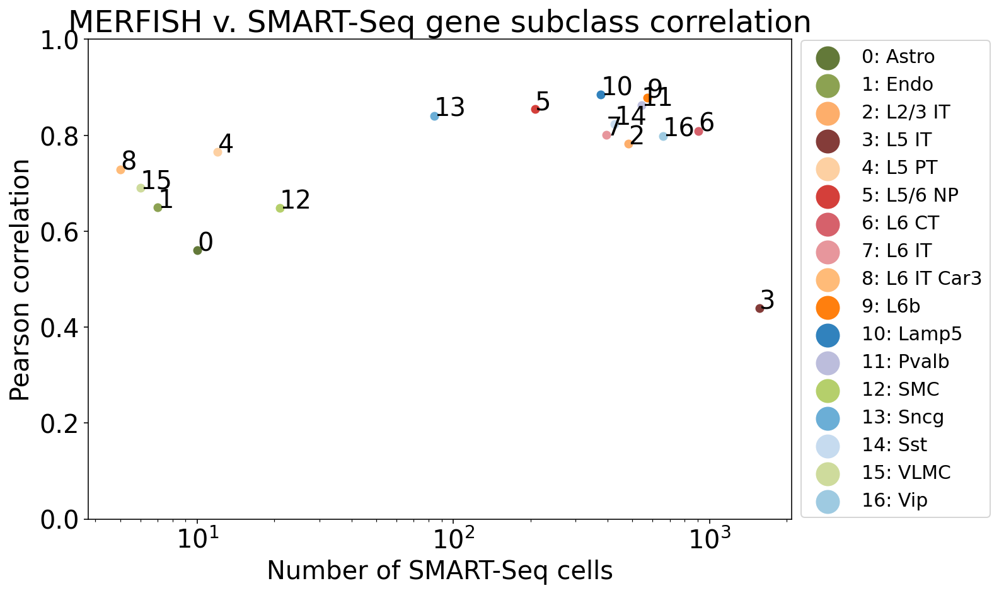

In [69]:
fig, ax = plt.subplots(figsize=(10,7))

x = ss_size
y = r2

for i, txt in enumerate(unique):
    ax.annotate(i, (x[i], y[i]))
    ax.scatter(x[i], y[i], label="{}: {}".format(i, txt), color=cluster_cmap[txt])
ax.set_ylim((0, 1))
ax.set_xscale("log")
    
ax.set_xlabel("Number of SMART-Seq cells")
ax.set_ylabel("Pearson correlation")
ax.legend(fontsize=15,loc='center left', bbox_to_anchor=(1, 0.5), markerscale=3)
ax.set_title("MERFISH v. SMART-Seq gene subclass correlation")

plt.savefig(trackfig("../../figures/merfish-updated_smartseq_correlation_size.png", TRACKFIG, NB), bbox_inches='tight', dpi=300)
plt.show()

In [70]:
def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

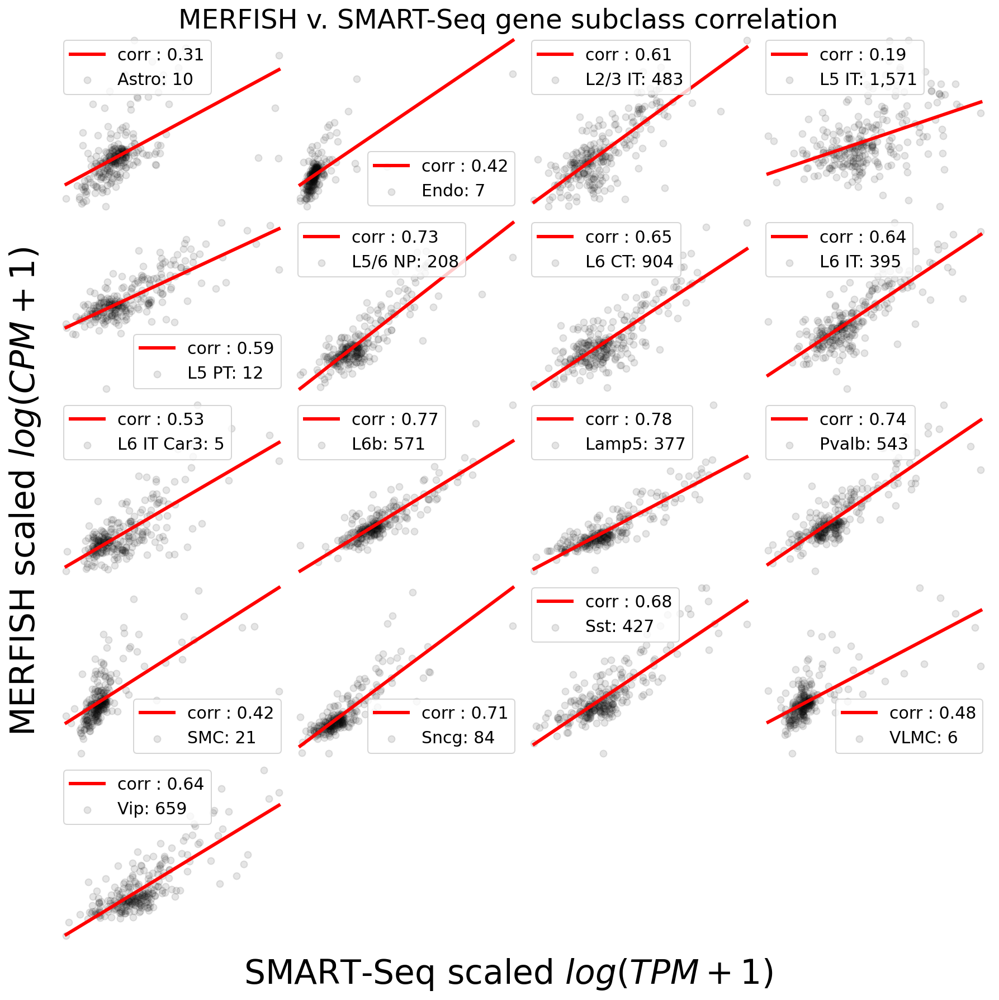

In [71]:
fig, ax = plt.subplots(figsize=(15,15), ncols=4, nrows=5)
fig.subplots_adjust(hspace=0, wspace=0)
axs = trim_axs(ax, len(unique))
fig.suptitle('MERFISH v. SMART-Seq gene subclass correlation', y=0.9)


for cidx, (ax, c) in enumerate(zip(axs, unique)):
    
    
    x = ss_x[cidx]
    y = mfish_x[cidx]

    
    ax.scatter(x, y, label="{}: {:,}".format(c, ss_size[cidx]), color="k", alpha=0.1)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

    minx = min(x)
    maxx = max(x)
    x = np.linspace(minx, maxx, 10)
    y = slope*x+intercept
    ax.plot(x, y, label="corr : {:,.2f}".format(r_value**2), color="red", linewidth=3)
    ax.legend(fontsize=15)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_axis_off()
fig.text(0.5, 0.1, 'SMART-Seq scaled $log(TPM+1)$', ha='center', va='center', fontsize=30)
fig.text(0.1, 0.5, 'MERFISH scaled $log(CPM+1)$', ha='center', va='center', rotation='vertical', fontsize=30)
plt.savefig(trackfig("../../figures/merfish-updated_smartseq_correlation_scatter.png", TRACKFIG, NB), bbox_inches='tight',dpi=300)

plt.show()

In [72]:
r2

[0.5602869626808273,
 0.6495524330063405,
 0.7820210105880154,
 0.43911275266985805,
 0.7657922121641035,
 0.8543240984197792,
 0.8090474914394583,
 0.8007171007330345,
 0.7291269019456826,
 0.879059877730467,
 0.8845680797822031,
 0.8626015726953518,
 0.6482292131005595,
 0.8409150024001599,
 0.8225616415890086,
 0.6902544944422973,
 0.7983531969836128]

In [73]:
unique.tolist()

['Astro',
 'Endo',
 'L2/3 IT',
 'L5 IT',
 'L5 PT',
 'L5/6 NP',
 'L6 CT',
 'L6 IT',
 'L6 IT Car3',
 'L6b',
 'Lamp5',
 'Pvalb',
 'SMC',
 'Sncg',
 'Sst',
 'VLMC',
 'Vip']